In [28]:
import copy
import os
import shutil

import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns
from dotmap import DotMap
from PIL import Image
from tqdm.auto import tqdm
from torch.utils.data import DataLoader
from torchvision.utils import save_image

from engine import CLIPClassifier
from datasets import CustomCollator, load_dataset

run_name = 'sleek-dream-151-epoch=28' #'classic-valley-148-epoch=18'

# Load dataset and model

In [2]:
dargs = DotMap()
dargs.dataset = 'original'
dargs.labels = 'fine_grained'
dargs.image_size = 224

split = 'train'

cargs = DotMap()
cargs.clip_pretrained_model = "openai/clip-vit-large-patch14"


In [3]:
dataset = load_dataset(args=dargs, split=split)
print("Number of examples:", len(dataset))
print("Sample item:", dataset[0])

collator = CustomCollator(cargs, dataset.fine_grained_labels)
dataloader = DataLoader(dataset, batch_size=1, shuffle=True, num_workers=1, collate_fn=collator)

Number of examples: 8500
Sample item: {'image': <PIL.Image.Image image mode=RGB size=224x224 at 0x7F36E271ED30>, 'text': 'its their character not their color that matters', 'label': 0, 'idx_meme': 42953, 'idx_image': 0, 'idx_text': 4901, 'disability_pc': 0, 'nationality_pc': 0, 'pc_empty_pc': 1, 'race_pc': 0, 'religion_pc': 0, 'sex_pc': 0, 'attack_empty_attack': 1, 'contempt_attack': 0, 'dehumanizing_attack': 0, 'exclusion_attack': 0, 'inciting_violence_attack': 0, 'inferiority_attack': 0, 'mocking_attack': 0, 'slurs_attack': 0}


In [4]:
checkpoint_path = f'checkpoints/{run_name}.ckpt'
args = DotMap()
args.use_pretrained_map = False
args.num_mapping_layers = 2
args.map_dim = 32
args.head = 'cross'
args.num_pre_output_layers = 0
args.lr = 0.0001
args.weight_decay = 0.0001
args.weight_fine_grained_loss = 1
args.drop_probs = [0.1, 0.4, 0.2]
args.clip_pretrained_model = "openai/clip-vit-large-patch14"
fine_grained_labels = ['disability_pc', 'nationality_pc', 'pc_empty_pc', 'race_pc', 'religion_pc', 'sex_pc',
    'attack_empty_attack', 'contempt_attack', 'dehumanizing_attack', 'exclusion_attack', 'inciting_violence_attack', 'inferiority_attack', 'mocking_attack', 'slurs_attack']

In [5]:
model = CLIPClassifier.load_from_checkpoint(checkpoint_path, args=args, fine_grained_labels=fine_grained_labels, compute_fine_grained_metrics=False)
model.automatic_optimization = False
model.eval()
print(model.training)

/home/gokul_kumar/anaconda3/lib/python3.9/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: Metric `AUROC` will save all targets and predictions in buffer. For large datasets this may lead to large memory footprint.
  warnings.warn(*args, **kwargs)


False


# Visualisation

## Vis V1

In [6]:
def normalize_features(features, min_thresh=0.5, max_thresh=0.5):
    min_, max_ = features.min(), features.max()
    features = (features - min_)/(max_ - min_ + 1e-7)
    features[features>=max_thresh] = 1.0
    features[features<min_thresh] = 0.0
    return features

In [7]:
# target_dir_f1 = 'data/hateful_memes_f1'
# target_dir_f2 = 'data/hateful_memes_f2'
# for batch_idx, batch in tqdm(enumerate(dataloader), total=len(dataloader)):

#     image_features, text_features = model.common_step(batch, batch_idx, calling_function='visualisation-v1')
#     image_features = image_features#.detach().numpy()
#     text_features = text_features#.detach().numpy()

#     features = torch.bmm(image_features.unsqueeze(2), text_features.unsqueeze(1)) # [batch_size, d, d]

#     features_dim = features.shape[1]
#     features_output = features.reshape(features.shape[0], -1) * model.output.state_dict()['weight'] + (model.output.state_dict()['bias']/features_dim**2) # [batch_size, d*d] * [1, d*d] + [1, 1] -> [batch_size, d*d]
#     features_output = features_output.reshape(features.shape)  # [batch_size, d*d] -> [batch_size, d, d]

#     #features = normalize_features(features)
#     features = torch.sigmoid(features) # Range: some -> [0, 1]
#     features[features>=0.5] = 1.0
#     features[features<0.5] = 0.0
#     #features_output = normalize_features(features_output)
#     features_output = torch.relu(features_output)

#     for i, idx in enumerate(batch['idx_memes']):
#         fn = f"{idx:05d}.png"
#         fp_f1 = f'{target_dir_f1}/{fn}'
#         fp_f2 = f'{target_dir_f2}/{fn}'
#         save_image(features[i], fp_f1)
#         # save_image(features_output[i], fp_f2)
#         plt.imsave(fp_f2, features_output[i].detach().numpy(), format="png", cmap="hot")

#         #axes[0].imshow(features[i].detach().numpy()*255, cmap='gray', vmin=0, vmax=255)
#         #axes[1].imshow(features_output[i].detach().numpy()*255, cmap='hot')
#         #sns.heatmap(features_output[i].detach().numpy(), ax=axes[1])
#         #plt.show()
#         #input('waiting...')



#     del image_features
#     del text_features
#     del features
#     del features_output

## Vis V2

In [8]:
target_dir= 'data/hateful_memes_f3'

if os.path.exists(target_dir):
    shutil.rmtree(target_dir)
os.mkdir(target_dir)

In [9]:
class DerivedModel(nn.Module):
    def __init__(self, pre_output, output):
        super(DerivedModel, self).__init__()
        self.pre_output = pre_output
        self.output = output
        self.cross_entropy_loss = torch.nn.BCEWithLogitsLoss(reduction='mean')

    def forward(self, features):
        features_pre_output = self.pre_output(features)
        logits = self.output(features_pre_output).squeeze(dim=1)

        preds_proxy = torch.sigmoid(logits)
        preds = (preds_proxy >= 0.5).long()

        loss = self.cross_entropy_loss(logits, torch.Tensor([1.0]*len(logits)))

        return loss

In [10]:
pre_output = copy.deepcopy(model.pre_output)
output = copy.deepcopy(model.output)
dmodel = DerivedModel(pre_output, output)
dmodel.eval()

DerivedModel(
  (pre_output): Sequential(
    (0): Dropout(p=0.4, inplace=False)
  )
  (output): Linear(in_features=1024, out_features=1, bias=True)
  (cross_entropy_loss): BCEWithLogitsLoss()
)

In [42]:
# get top positives and negatives
features = torch.zeros((1, 1024))
features.requires_grad = True

loss = dmodel.forward(features)
dmodel.zero_grad()
loss.backward()

features_grad = -features.grad.data
features_grad = features_grad.squeeze().reshape(args.map_dim, args.map_dim)
print(features_grad.shape)

q = torch.quantile(features_grad, 0.8)
top_pos_positions = (features_grad >= q).nonzero().tolist()
top_pos_positions = [tuple(l) for l in top_pos_positions]

q = torch.quantile(features_grad, 0.2)
top_neg_positions = (features_grad <= q).nonzero().tolist()
top_neg_positions = [tuple(l) for l in top_neg_positions]

#print(top_pos_positions)
#print(top_neg_positions)

torch.Size([32, 32])
[(0, 1), (0, 3), (0, 11), (0, 12), (0, 15), (0, 19), (0, 20), (0, 22), (0, 23), (0, 26), (0, 29), (0, 31), (2, 31), (3, 3), (3, 11), (3, 12), (3, 15), (3, 19), (3, 20), (3, 23), (3, 26), (3, 29), (3, 31), (4, 3), (4, 11), (4, 12), (4, 15), (4, 19), (4, 20), (4, 23), (4, 26), (4, 29), (4, 31), (5, 11), (5, 20), (5, 23), (5, 31), (6, 2), (6, 4), (6, 7), (6, 14), (6, 17), (6, 25), (7, 25), (8, 5), (8, 12), (8, 19), (8, 20), (8, 29), (8, 31), (9, 2), (9, 7), (9, 14), (9, 17), (9, 24), (9, 25), (10, 11), (10, 12), (10, 19), (10, 20), (10, 22), (10, 23), (10, 26), (10, 29), (10, 31), (11, 2), (11, 4), (11, 6), (11, 10), (11, 13), (11, 14), (11, 16), (11, 17), (11, 21), (11, 24), (11, 25), (11, 27), (11, 28), (11, 30), (12, 12), (12, 15), (12, 19), (12, 23), (12, 29), (13, 1), (13, 3), (13, 12), (13, 15), (13, 20), (13, 23), (13, 26), (13, 29), (13, 31), (15, 1), (15, 3), (15, 12), (15, 15), (15, 19), (15, 23), (15, 26), (15, 29), (15, 31), (16, 0), (16, 2), (16, 6), (16,

In [43]:
pos_vectors = []
neg_vectors = []
dir_vectors = []
ids = []
for batch_idx, batch in tqdm(enumerate(dataloader), total=len(dataloader)):

    assert len(batch['pixel_values']) == 1

    if batch_idx == 200:
        break

    if batch['labels'][0].item() == 1:
        features = model.common_step(batch, batch_idx, calling_function='visualisation-v2').detach()
        features = features.squeeze().reshape(args.map_dim, args.map_dim)
        mul = features #* features_grad
        label = {0: 'non-hateful', 1: 'hateful'}[batch['labels'][0].item()]

        q = torch.quantile(mul, 0.9)
        top_pos_positions_local = (mul >= q).nonzero().tolist()
        top_pos_positions_local = [tuple(l) for l in top_pos_positions_local]

        q = torch.quantile(mul, 0.1)
        top_neg_positions_local = (mul <= q).nonzero().tolist()
        top_neg_positions_local = [tuple(l) for l in top_neg_positions_local]

        matching_pos = np.array(list(set(top_pos_positions).intersection(set(top_pos_positions_local))))
        matching_neg = np.array(list(set(top_neg_positions).intersection(set(top_neg_positions_local))))


        pos_vector, neg_vector = np.zeros((args.map_dim, args.map_dim)), np.zeros((args.map_dim, args.map_dim))
        dir_vector = np.zeros((args.map_dim, args.map_dim))
        if len(matching_pos):
            pos_vector[matching_pos[:, 0], matching_pos[:, 1]] = 1
            dir_vector[matching_pos[:, 0], matching_pos[:, 1]] = 1
        if len(matching_neg):
            neg_vector[matching_neg[:, 0], matching_neg[:, 1]] = 1
            dir_vector[matching_neg[:, 0], matching_neg[:, 1]] = -1
        pos_vector = pos_vector.flatten()
        neg_vector = neg_vector.flatten()
        dir_vector = dir_vector.flatten()

        #pos_vectors.append(pos_vector)
        #neg_vectors.append(neg_vector)
        dir_vectors.append(dir_vector)
        ids.append(batch['idx_memes'][0].item())


        # print(label)
        # print(len(set(top_pos_positions).intersection(set(top_pos_positions_local))))
        # print(len(set(top_neg_positions).intersection(set(top_neg_positions_local))))

        del features
        del mul
        del top_pos_positions_local
        del top_neg_positions_local
        del matching_pos
        del matching_neg
        del pos_vector
        del neg_vector
        del dir_vector



  0%|          | 0/8500 [00:00<?, ?it/s]

/home/gokul_kumar/anaconda3/lib/python3.9/site-packages/torchmetrics/utilities/prints.py:36: UserWarning: No negative samples in targets, false positive value should be meaningless. Returning zero tensor in false positive score
  warnings.warn(*args, **kwargs)


In [44]:
len(ids)

79

In [45]:
from sklearn.cluster import KMeans
num_clusters = 15
kmeans_dir = KMeans(n_clusters=num_clusters, random_state=0).fit(dir_vectors)
# kmeans_pos = KMeans(n_clusters=num_clusters, random_state=0).fit(pos_vectors)
# kmeans_neg = KMeans(n_clusters=num_clusters, random_state=0).fit(neg_vectors)

clusters_dir = np.array(kmeans_dir.labels_)
# clusters_pos = np.array(kmeans_pos.labels_)
# clusters_neg = np.array(kmeans_neg.labels_)
ids = np.array(ids)

print(clusters_dir)

[ 0 14  0  9  8  9  9  9  9  9  6 11  3  9 13  9 13  7  4  9  9  0  9  9
  9 11  9 13  0  9  4  9  9  0  4  9  9 10  7  9  5 11  9  9  9  4 13  9
 12 12  9  9  0  0  9  9 11  9  9  9  5 13 13  9 13  9  6  4  9  0  0  9
  2  4  9 13  1  6 11]


Cluster 0


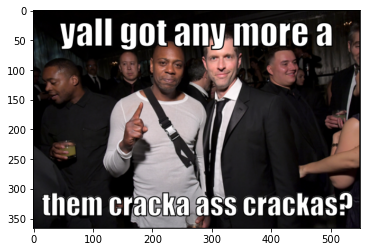

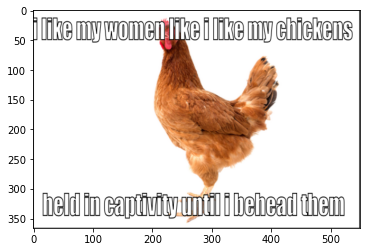

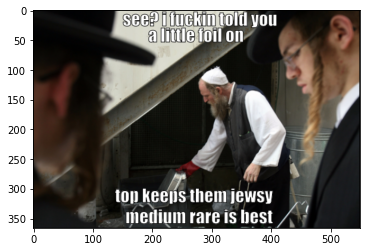

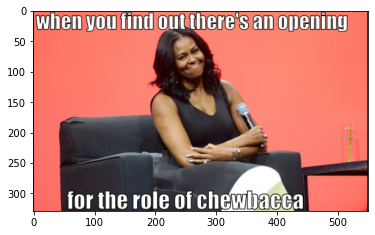

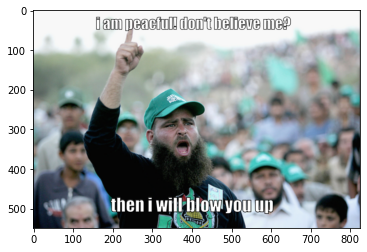

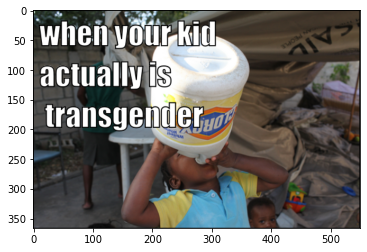

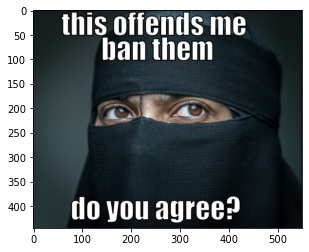

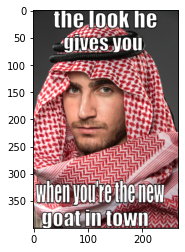

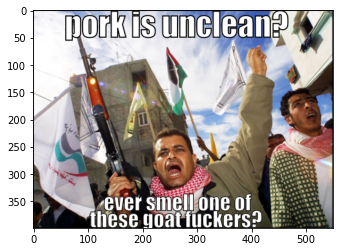

****************************************************************************************************
Cluster 1


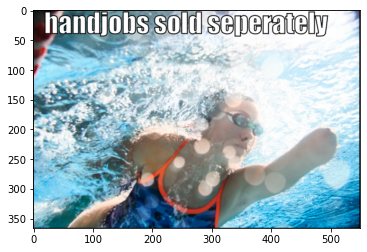

****************************************************************************************************
Cluster 2


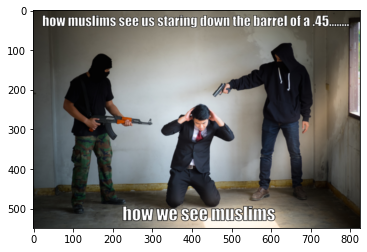

****************************************************************************************************
Cluster 3


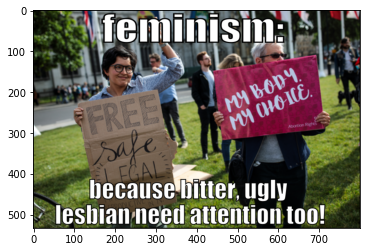

****************************************************************************************************
Cluster 4


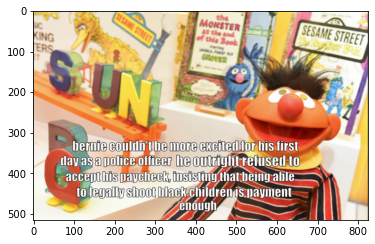

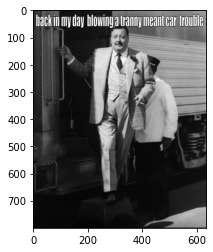

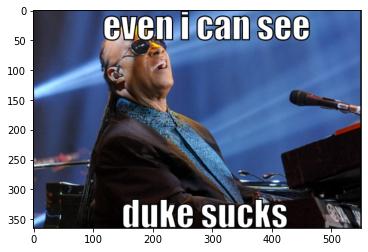

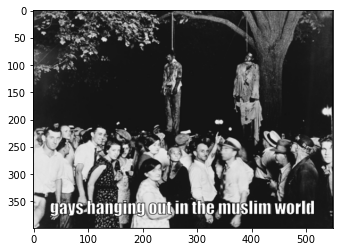

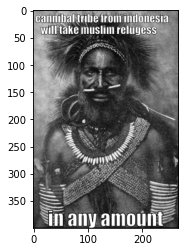

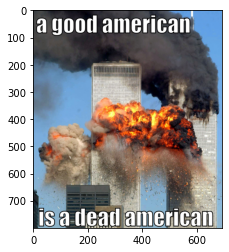

****************************************************************************************************
Cluster 5


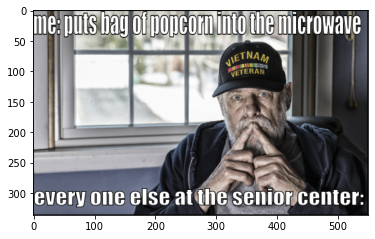

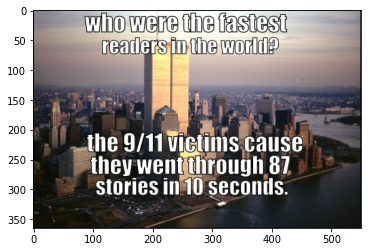

****************************************************************************************************
Cluster 6


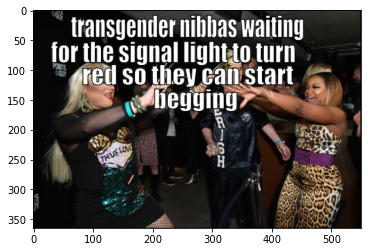

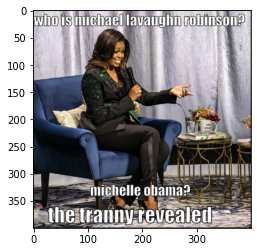

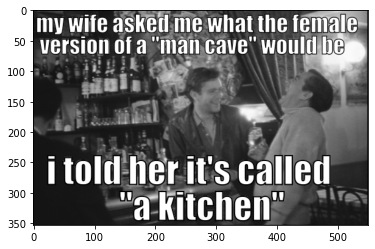

****************************************************************************************************
Cluster 7


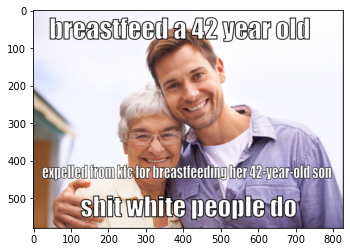

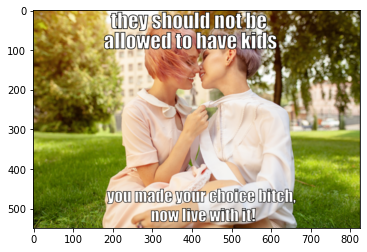

****************************************************************************************************
Cluster 8


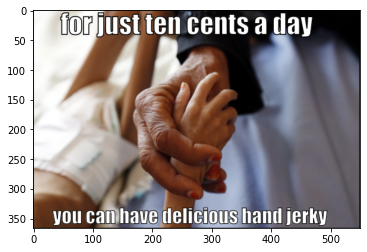

****************************************************************************************************
Cluster 9


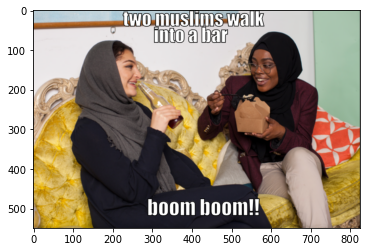

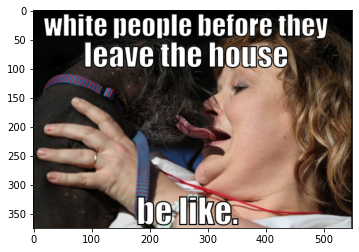

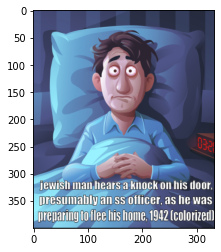

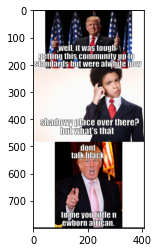

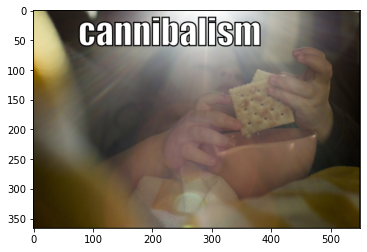

...

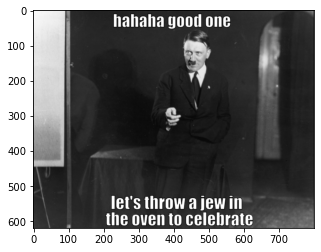

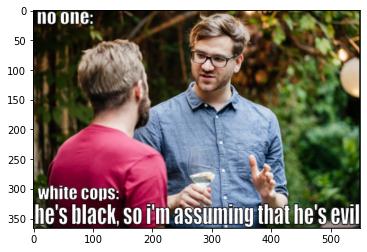

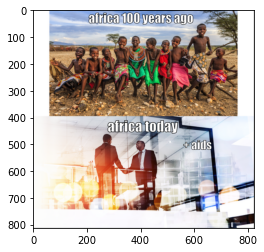

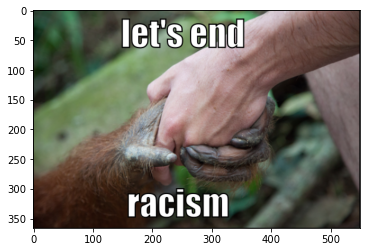

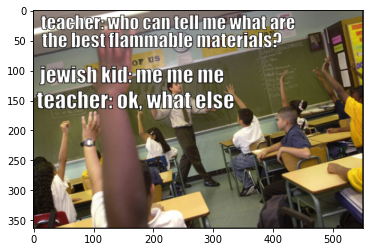

****************************************************************************************************
Cluster 10


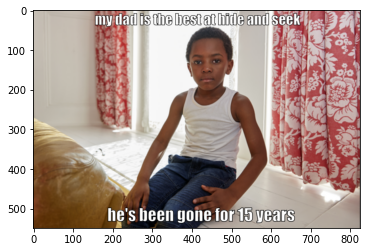

****************************************************************************************************
Cluster 11


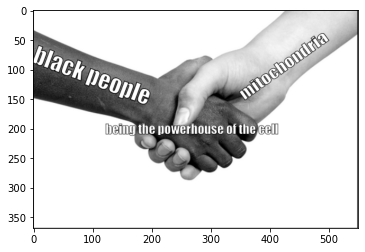

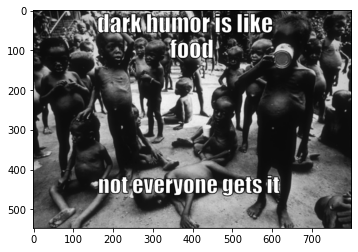

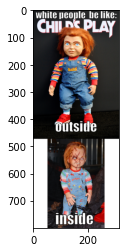

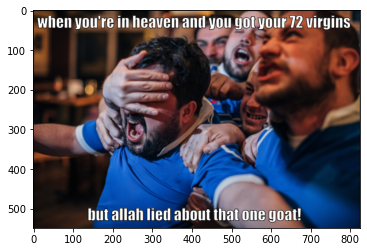

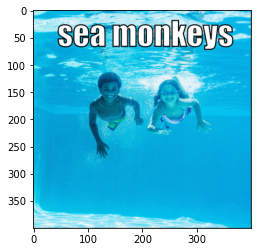

****************************************************************************************************
Cluster 12


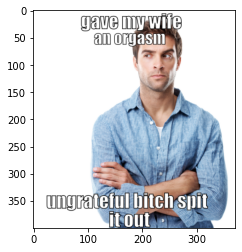

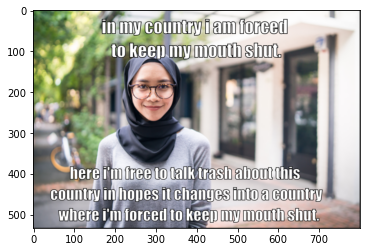

****************************************************************************************************
Cluster 13


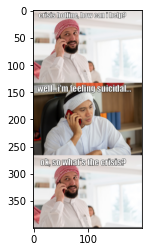

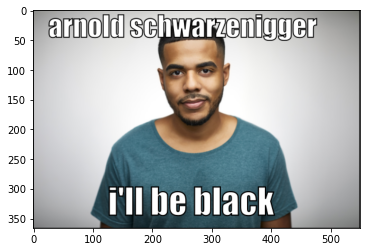

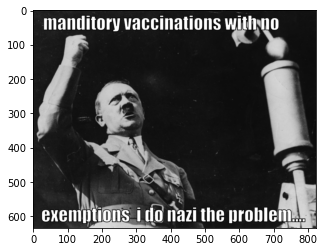

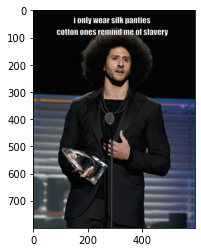

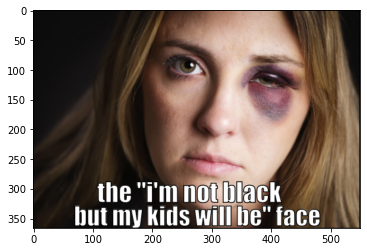

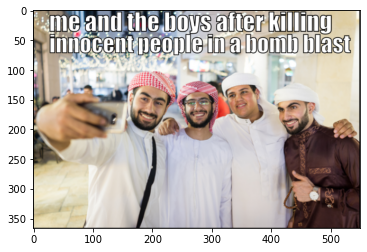

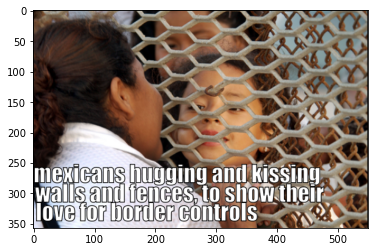

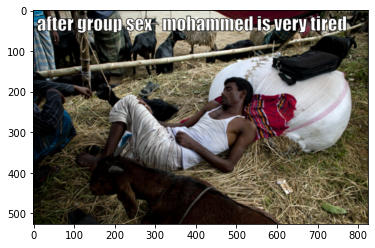

****************************************************************************************************
Cluster 14


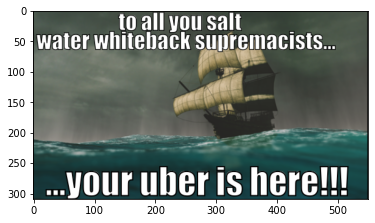

****************************************************************************************************


In [46]:
for i in range(num_clusters):
    ids_cluster = ids[clusters_dir == i]
    ids_cluster = [f"data/hateful_memes/img/{i:05d}.png" for i in ids_cluster]
    print(f'Cluster {i}')
    for i in ids_cluster:
        plt.imshow(Image.open(i))
        plt.show()

    print("*"*100)


  0%|          | 0/8500 [00:00<?, ?it/s]

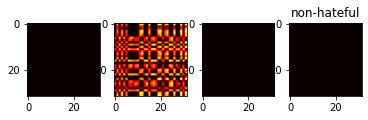

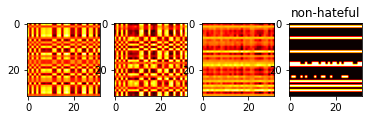

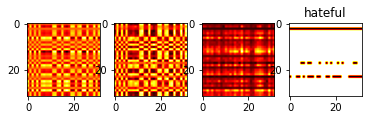

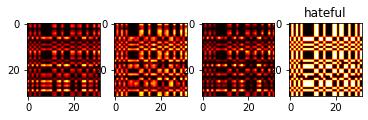

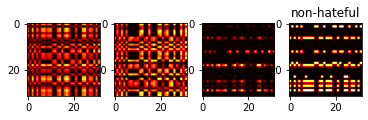

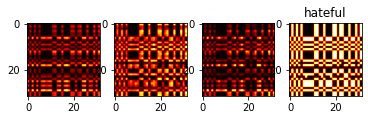

KeyboardInterrupt: Interrupted by user

In [59]:
for batch_idx, batch in tqdm(enumerate(dataloader), total=len(dataloader)):

    assert len(batch['pixel_values']) == 1

    features = model.common_step(batch, batch_idx, calling_function='visualisation-v2').detach()
    if batch_idx == 0:
        features = torch.zeros((1, 1024))
    features.requires_grad = True

    loss = dmodel.forward(features)
    dmodel.zero_grad()
    loss.backward()

    features_grad = -features.grad.data

    features = features.squeeze().reshape(args.map_dim, args.map_dim)
    features_grad = features_grad.squeeze().reshape(features.shape)


    if batch_idx not in [1, 2]:
        features = torch.relu(features)
        features_grad = torch.relu(features_grad)

    mul = features * features_grad
    mul_dir = torch.sign(features) * torch.sign(features_grad)

    features = features.detach().numpy()
    features_grad = features_grad.detach().numpy()
    mul = mul.detach().numpy()
    mul_dir = mul_dir.detach().numpy()



    fig, axes = plt.subplots(1, 4)
    axes[0].imshow(features, cmap='hot')
    axes[1].imshow(features_grad, cmap='hot')
    axes[2].imshow(mul, cmap='hot')
    axes[3].imshow(mul_dir, cmap='hot')




    label = {0: 'non-hateful', 1: 'hateful'}[batch['labels'][0].item()]
    plt.title(f'{label}')
    plt.show()

    del features
    del features_grad

    input('waiting...')